<a href="https://colab.research.google.com/github/mvram123/Wind-Turbine-Rotor-Temp-Prediction/blob/main/Renew_Wind_Turbine_Hackathon.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importing Libraries

In [ ]:
!pip install catboost
!pip install ipywidgets
!jupyter nbextension enable --py widgetsnbextension

In [ ]:
import os
import math
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from collections import Counter

### Utility Functions

In [ ]:
def load_test_data(test_data_path= "/content/drive/MyDrive/Renew Power Hackathon/test.csv", drop_columns=[]):
  test_data = pd.read_csv(test_data_path)
  test_data = test_data.drop(drop_columns, axis=1)
  return test_data

In [ ]:
def gen_and_save_sub_file(X_test, model, y_scaler=False, sub_file_name="sub"):
  output_dir = "/content/drive/MyDrive/Renew Power Hackathon/submissions/"
  y_predicted = model.predict(X_test)
  if y_scaler != False:
    y_predicted = y_scaler.inverse_transform(y_predicted)
    y_predicted = y_predicted.reshape(1, -1)[0]
  sub = pd.DataFrame(y_predicted, columns=["Target"])
  sub.to_csv(output_dir+sub_file_name+".csv", index=False)

In [ ]:
import math
import numpy as np

def transformation(column):
  max_value = column.max()
  sin_values = [math.sin((2*(22/7)*x)/max_value) for x in list(column)]
  cos_values = [math.cos((2*(22/7)*x)/max_value) for x in list(column)]
  return np.array(sin_values), np.array(cos_values)

### Importing Data

In [ ]:
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')

In [ ]:
print(train_data.shape)
train_data.head()

(909604, 16)


,timestamp,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,wind_direction_raw,wind_speed_raw,wind_speed_turbulence,turbine_id,Target
0,2021-02-19 20:18:00,816.636759,834.917206,31.694380,1159.616602,65.954214,917.897085,31.881972,31.504713,141.457644,165.501518,280.864782,7.057000,0.544082,Turbine_108,47.582787
1,2021-04-27 04:55:00,419.107829,421.050873,12.894948,928.747996,59.571319,445.554250,32.423705,32.755770,89.186457,113.835236,299.552460,5.474937,0.469031,Turbine_18,46.070328
2,2021-01-25 06:26:00,1303.530558,1337.566142,16.648388,1201.219775,61.270498,1364.716003,11.446849,18.332985,230.622309,281.452253,84.960106,8.092457,0.622318,Turbine_105,39.989236
3,2021-10-30 03:47:00,61.494872,53.481008,28.388141,769.806122,40.674348,14.324897,34.253204,32.662889,66.211015,75.017531,87.261119,4.071032,0.760719,Turbine_15,46.056587
4,2021-03-15 00:39:00,593.514364,611.659108,31.519527,1046.916768,64.341763,599.020172,32.405586,31.466387,137.163938,160.202421,313.724818,6.357943,0.346068,Turbine_01,54.346095


In [ ]:
print(test_data.shape)
test_data.head()

(303202, 14)


,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,wind_direction_raw,wind_speed_raw,wind_speed_turbulence,turbine_id
0,15.507537,19.956882,40.233264,410.538834,57.357366,84.008399,48.826597,45.363477,2.419202,1.468876,156.399396,2.438629,0.790435,Turbine_14
1,472.577255,478.373881,12.306687,965.077563,51.796728,492.531362,27.457511,24.045565,96.152070,119.378235,56.443802,5.900371,0.544198,Turbine_19
2,447.829615,451.158264,29.106771,948.035899,60.493098,393.151576,39.410553,35.715697,90.251529,117.192635,224.540263,5.924923,0.513481,Turbine_14
3,254.014336,249.438965,27.074900,804.963776,55.741899,178.715101,29.476841,31.151895,89.273838,105.086257,182.151426,4.409707,0.448881,Turbine_120
4,1174.930566,1202.654077,32.148434,1199.754858,67.272313,1115.850317,31.920549,30.864276,189.731988,236.053320,261.672180,7.822326,0.561465,Turbine_158


In [ ]:
train_data = train_data.drop('timestamp', axis=1)

In [ ]:
train_data.shape, test_data.shape

((909604, 15), (303202, 14))

In [ ]:
train_data.head(2)

,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,wind_direction_raw,wind_speed_raw,wind_speed_turbulence,turbine_id,Target
0,816.636759,834.917206,31.694380,1159.616602,65.954214,917.897085,31.881972,31.504713,141.457644,165.501518,280.864782,7.057000,0.544082,Turbine_108,47.582787
1,419.107829,421.050873,12.894948,928.747996,59.571319,445.554250,32.423705,32.755770,89.186457,113.835236,299.552460,5.474937,0.469031,Turbine_18,46.070328


### Univariate Analysis

In [ ]:
print(train_data.shape)
train_data.head(2)

(909604, 24)


,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,...,Target,wind_direction_cosine,wind_direction_sin,wind_direction_classes,active_power_loss,reactive_power_loss,converter_power_loss,nacelle_temp_change,inside_temp_change,surface_temp_change
0,816.636759,834.917206,31.694380,1159.616602,65.954214,917.897085,31.881972,31.504713,141.457644,165.501518,...,47.582787,0.190429,-0.981701,W,18.280446,24.043874,101.260325,-0.377259,34.072243,0.189667
1,419.107829,421.050873,12.894948,928.747996,59.571319,445.554250,32.423705,32.755770,89.186457,113.835236,...,46.070328,0.495050,-0.868865,WNW,1.943044,24.648778,26.446421,0.332065,27.147614,-19.860822


In [ ]:
train_data.describe()

,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,...,wind_speed_turbulence,Target,wind_direction_cosine,wind_direction_sin,active_power_loss,reactive_power_loss,converter_power_loss,nacelle_temp_change,inside_temp_change,surface_temp_change
count,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,...,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000
mean,525.886061,537.639468,25.573921,931.130882,60.730112,527.579537,31.755823,31.686413,111.080610,133.692333,...,0.651916,46.328595,0.098014,-0.177521,11.753407,22.611723,1.693476,-0.069410,28.974289,-6.112492
std,474.619576,482.394907,8.025649,193.674384,9.721582,472.656976,3.929794,3.554426,78.219944,91.232152,...,0.317513,2.617691,0.629508,0.750067,41.145612,16.269664,148.090229,2.958234,10.279144,7.495892
min,0.000000,0.000008,5.616541,0.000000,25.636366,0.000000,11.141922,16.010218,-318.393721,-5.461607,...,0.000000,25.865320,-1.000000,-1.000000,-1626.539569,-245.480583,-1861.318689,-7.805130,-9.701803,-24.943896
25%,149.620898,155.813244,17.093680,770.538574,54.916767,147.181552,29.913803,30.267423,81.540850,96.045765,...,0.432129,44.816740,-0.442848,-0.897140,-4.640493,11.744247,-53.048833,-2.681466,22.502224,-13.494597
50%,379.989929,383.985926,27.919035,884.068502,60.034490,391.303187,31.762946,31.961610,92.005826,107.633378,...,0.583863,46.302899,0.149977,-0.449464,5.365747,19.978813,-0.415924,-0.434664,28.109945,-4.142037
75%,781.357475,800.261108,32.171696,1123.335856,65.737187,794.875710,33.469745,33.546260,124.879153,154.153730,...,0.798240,47.733105,0.679648,0.630788,21.194461,31.365818,59.300194,2.080702,34.849787,0.206667
max,1999.999858,1999.984456,48.089017,1267.140625,129.846405,1999.991455,52.790030,48.406106,523.892695,592.815938,...,9.534769,65.037689,0.999985,1.000000,1829.804627,492.170963,1888.417704,12.387167,99.845596,5.710177


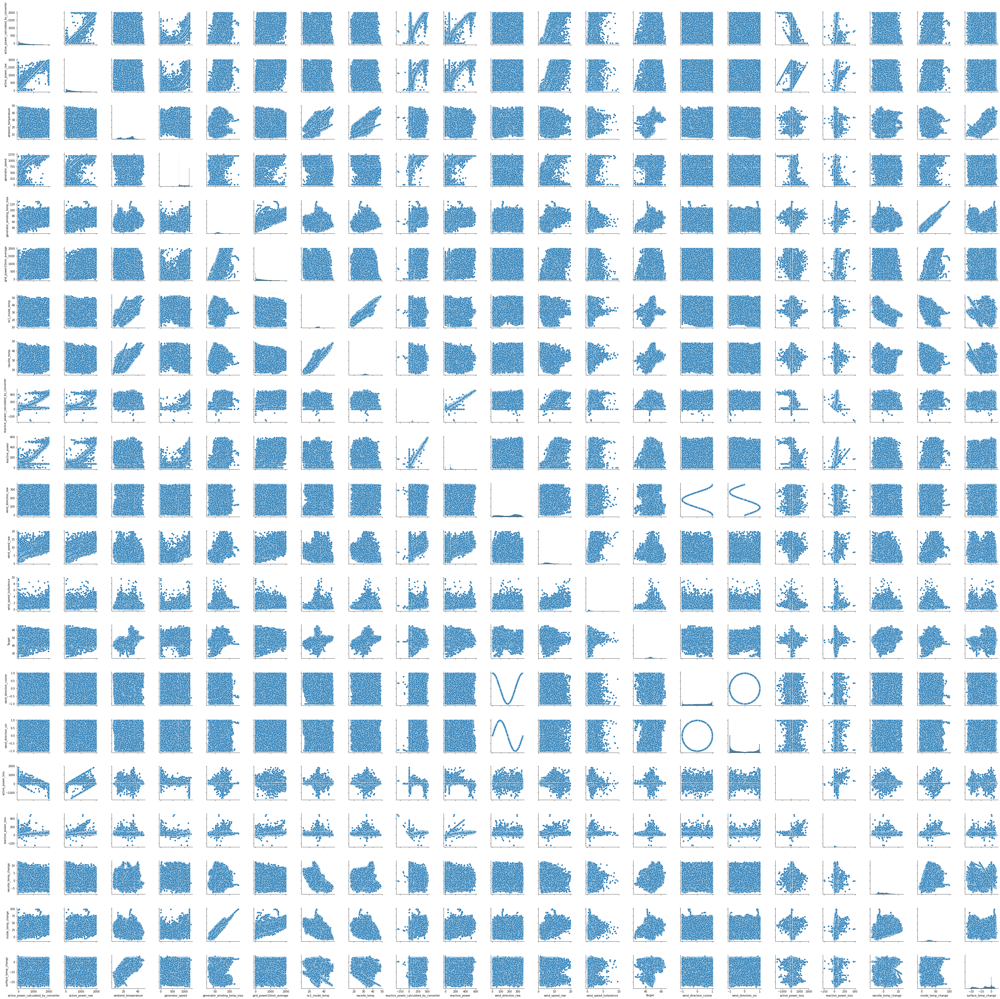

In [ ]:
sns.pairplot(train_data)

In [ ]:
train_data.columns

Index(['active_power_calculated_by_converter', 'active_power_raw',
       'ambient_temperature', 'generator_speed', 'generator_winding_temp_max',
       'grid_power10min_average', 'nc1_inside_temp', 'nacelle_temp',
       'reactice_power_calculated_by_converter', 'reactive_power',
       'wind_direction_raw', 'wind_speed_raw', 'wind_speed_turbulence',
       'turbine_id', 'Target', 'wind_direction_cosine', 'wind_direction_sin',
       'wind_direction_classes', 'active_power_loss', 'reactive_power_loss',
       'converter_power_loss', 'nacelle_temp_change', 'inside_temp_change',
       'surface_temp_change'],
      dtype='object')

In [ ]:
cat_cols = ['turbine_id', 'wind_direction_classes']

In [ ]:
num_cols = [i for i in train_data.columns if i not in cat_cols]

In [ ]:
len(num_cols)

22

In [ ]:
num_cols

['active_power_calculated_by_converter',
 'active_power_raw',
 'ambient_temperature',
 'generator_speed',
 'generator_winding_temp_max',
 'grid_power10min_average',
 'nc1_inside_temp',
 'nacelle_temp',
 'reactice_power_calculated_by_converter',
 'reactive_power',
 'wind_direction_raw',
 'wind_speed_raw',
 'wind_speed_turbulence',
 'Target',
 'wind_direction_cosine',
 'wind_direction_sin',
 'active_power_loss',
 'reactive_power_loss',
 'converter_power_loss',
 'nacelle_temp_change',
 'inside_temp_change',
 'surface_temp_change']

Bimodel distributions ref - [link](https://www.kaggle.com/code/iamleonie/handling-multimodal-distributions-fe-techniques)

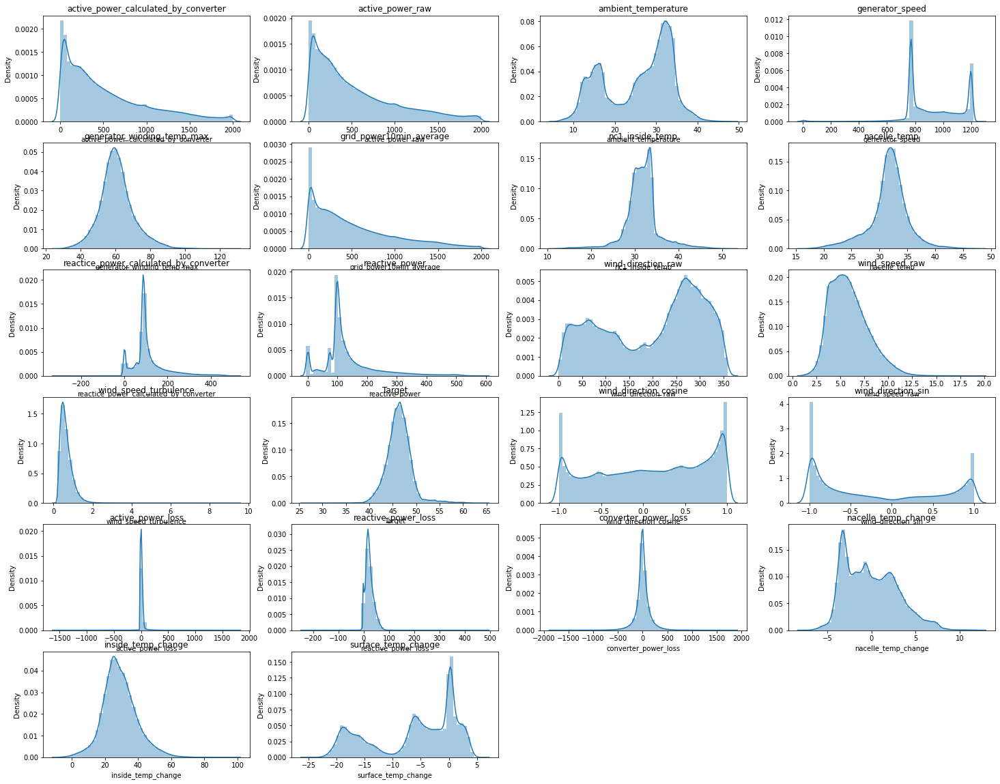

In [ ]:
### Checking Distributions
plt.figure(figsize=(25, 20))
for num, i in enumerate(num_cols):
  plt.subplot(6, 4, num+1)
  #px.histogram(train_data[i])
  sns.distplot(train_data[i])
  plt.title(i)
plt.show()

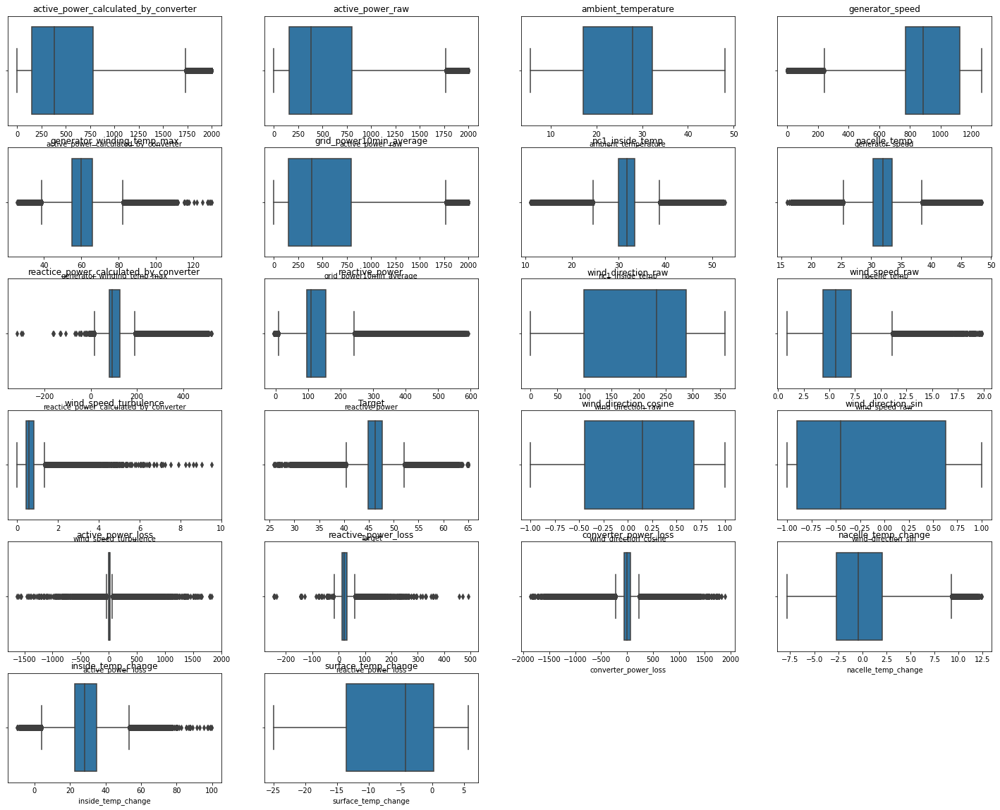

In [ ]:
### Checking Outliers
plt.figure(figsize=(25, 20))
for num, i in enumerate(num_cols):
  plt.subplot(6, 4, num+1)
  #px.histogram(train_data[i])
  sns.boxplot(train_data[i])
  plt.title(i)
plt.show()

In [ ]:
print(train_data.shape)
train_data.head(2)

(909604, 24)


,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,...,Target,wind_direction_cosine,wind_direction_sin,wind_direction_classes,active_power_loss,reactive_power_loss,converter_power_loss,nacelle_temp_change,inside_temp_change,surface_temp_change
0,816.636759,834.917206,31.694380,1159.616602,65.954214,917.897085,31.881972,31.504713,141.457644,165.501518,...,47.582787,0.190429,-0.981701,W,18.280446,24.043874,101.260325,-0.377259,34.072243,0.189667
1,419.107829,421.050873,12.894948,928.747996,59.571319,445.554250,32.423705,32.755770,89.186457,113.835236,...,46.070328,0.495050,-0.868865,WNW,1.943044,24.648778,26.446421,0.332065,27.147614,-19.860822


In [ ]:
# Skewness
train_data[num_cols].skew()

active_power_calculated_by_converter      1.094894
active_power_raw                          1.079560
ambient_temperature                      -0.405606
generator_speed                          -0.432870
generator_winding_temp_max                0.482791
grid_power10min_average                   1.008062
nc1_inside_temp                           0.040530
nacelle_temp                             -0.427542
reactice_power_calculated_by_converter    1.731298
reactive_power                            1.638332
wind_direction_raw                       -0.363971
wind_speed_raw                            0.718327
wind_speed_turbulence                     2.205472
Target                                    0.705359
wind_direction_cosine                    -0.216209
wind_direction_sin                        0.385152
active_power_loss                         5.461367
reactive_power_loss                       1.194180
converter_power_loss                     -0.407975
nacelle_temp_change            

Kurtosis & Skewness Reference Link: [link](https://www.itl.nist.gov/div898/handbook/eda/section3/eda35b.htm#:~:text=Skewness%20is%20a%20measure%20of,relative%20to%20a%20normal%20distribution.)

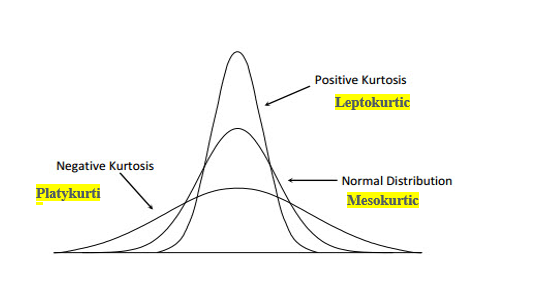

In [ ]:
train_data[num_cols].kurt()

active_power_calculated_by_converter        0.461064
active_power_raw                            0.356482
ambient_temperature                        -1.102810
generator_speed                             1.561075
generator_winding_temp_max                  1.217988
grid_power10min_average                     0.235233
nc1_inside_temp                             4.299024
nacelle_temp                                1.922252
reactice_power_calculated_by_converter      4.080529
reactive_power                              3.537841
wind_direction_raw                         -1.268121
wind_speed_raw                              0.641406
wind_speed_turbulence                      15.870802
Target                                      3.915567
wind_direction_cosine                      -1.233832
wind_direction_sin                         -1.498008
active_power_loss                         229.865661
reactive_power_loss                         8.777711
converter_power_loss                       10.

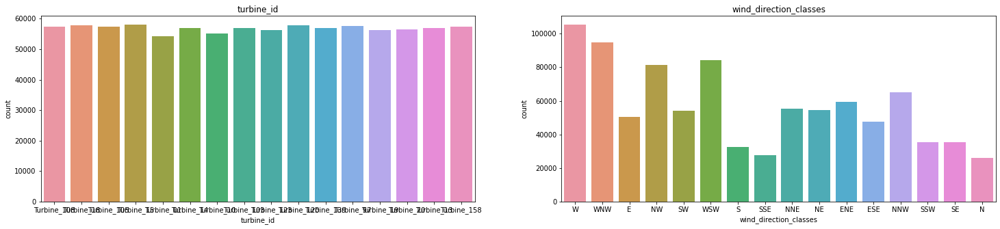

In [ ]:
# Count Plot
plt.figure(figsize=(25, 5))
for num, i in enumerate(cat_cols):
  plt.subplot(1, 2, num+1)
  #px.histogram(train_data[i])
  sns.countplot(train_data[i])
  plt.title(i)
plt.show()

In [ ]:
d = train_data.groupby('turbine_id')['Target'].mean().to_dict()
d.keys(), d.values()

(dict_keys(['Turbine_01', 'Turbine_10', 'Turbine_103', 'Turbine_105', 'Turbine_108', 'Turbine_120', 'Turbine_123', 'Turbine_13', 'Turbine_139', 'Turbine_14', 'Turbine_15', 'Turbine_158', 'Turbine_18', 'Turbine_19', 'Turbine_20', 'Turbine_97']),
 dict_values([49.288457959582026, 47.186210397038806, 45.60475906464273, 46.5858776511966, 46.54900600380182, 45.51775972063868, 44.64201088141076, 46.85506807431135, 45.643602629934904, 47.72284888064234, 46.38837779094387, 45.56336487732998, 45.178387215053235, 44.46386599524247, 48.4206300779223, 45.83431381473281]))

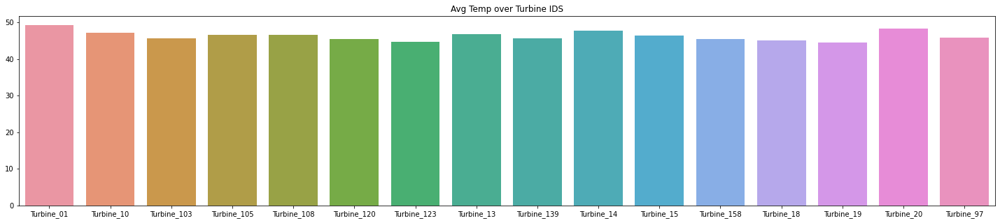

In [ ]:
plt.figure(figsize=(25, 5))
sns.barplot(x=list(d.keys()), y=list(d.values()))
plt.title('Avg Temp over Turbine IDS')
plt.show()

In [ ]:
d = train_data.groupby('wind_direction_classes')['Target'].mean().to_dict()

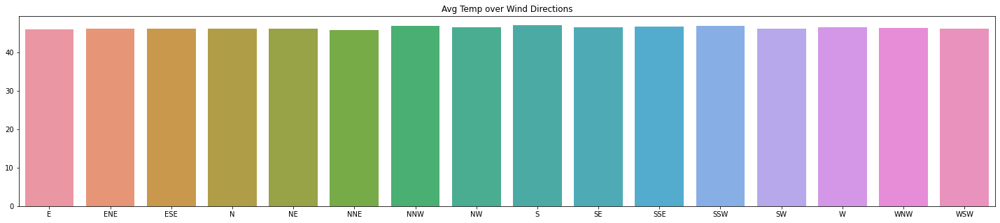

In [ ]:
plt.figure(figsize=(25, 5))
sns.barplot(x=list(d.keys()), y=list(d.values()))
plt.title('Avg Temp over Wind Directions')
plt.show()

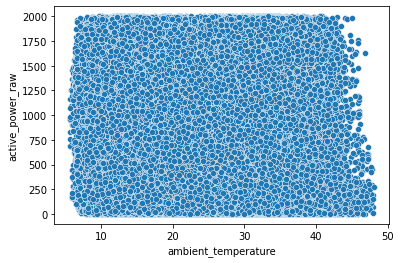

In [ ]:
sns.scatterplot(train_data['ambient_temperature'], train_data['active_power_raw'])

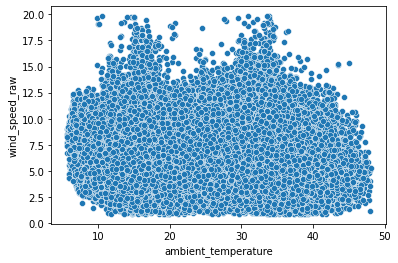

In [ ]:
sns.scatterplot(train_data['ambient_temperature'], train_data['wind_speed_raw'])

### MulitVariate Analysis

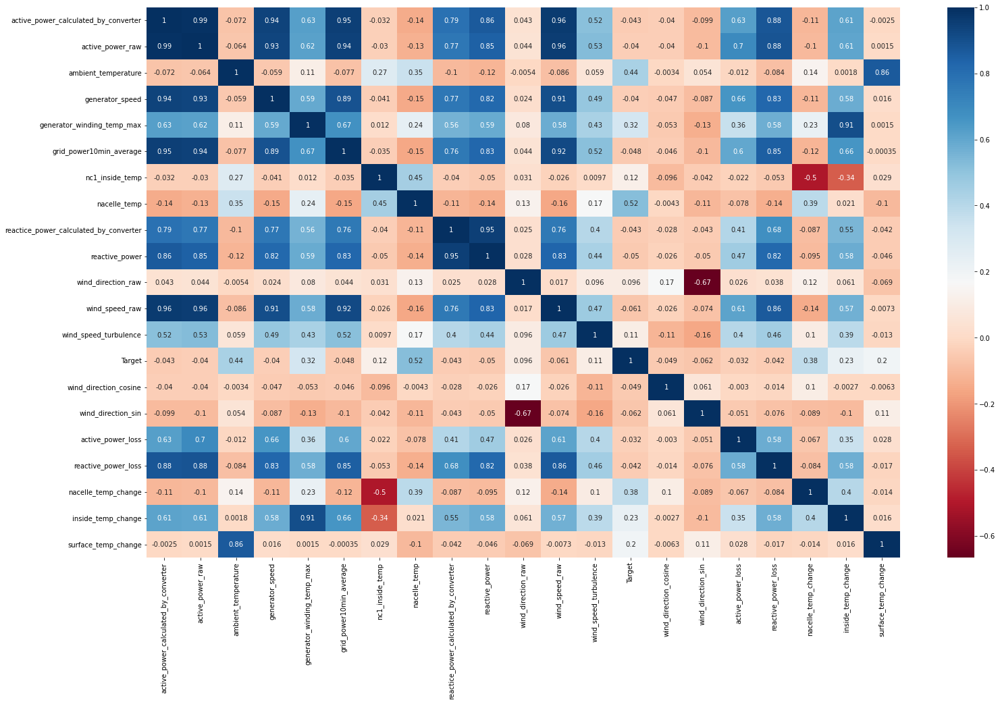

In [ ]:
# spearmen rank correlation
plt.figure(figsize=(25, 15))
sns.heatmap(train_data.corr("spearman"), annot=True,cmap='RdBu')
plt.show()

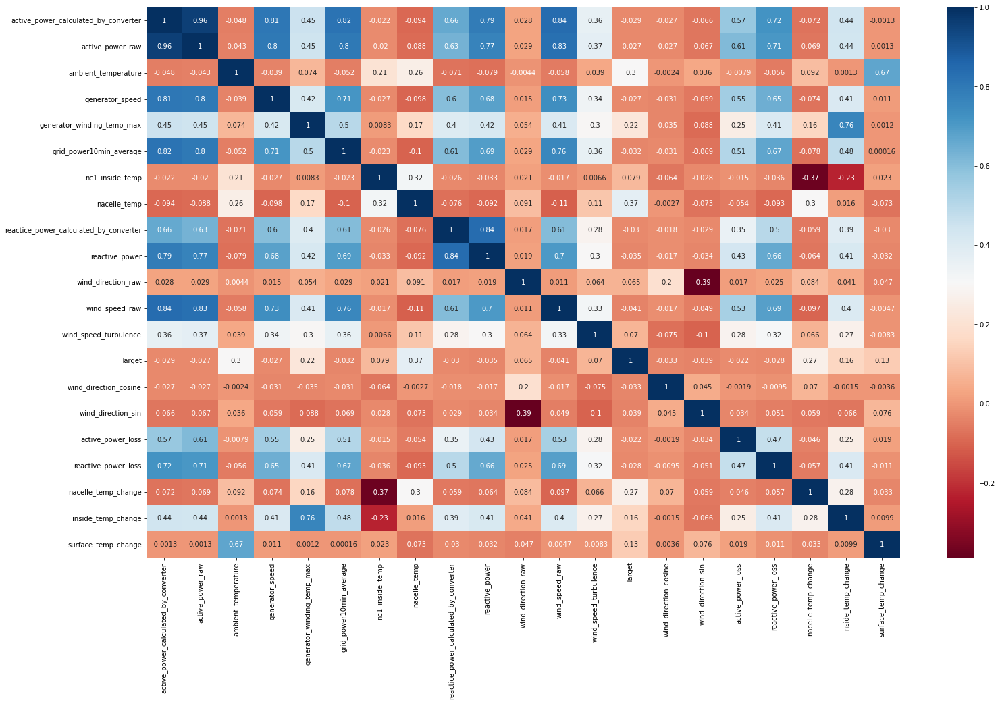

In [ ]:
# Kendall rank correlation
plt.figure(figsize=(25, 15))
sns.heatmap(train_data.corr("kendall"), annot=True,cmap='RdBu')
plt.show()

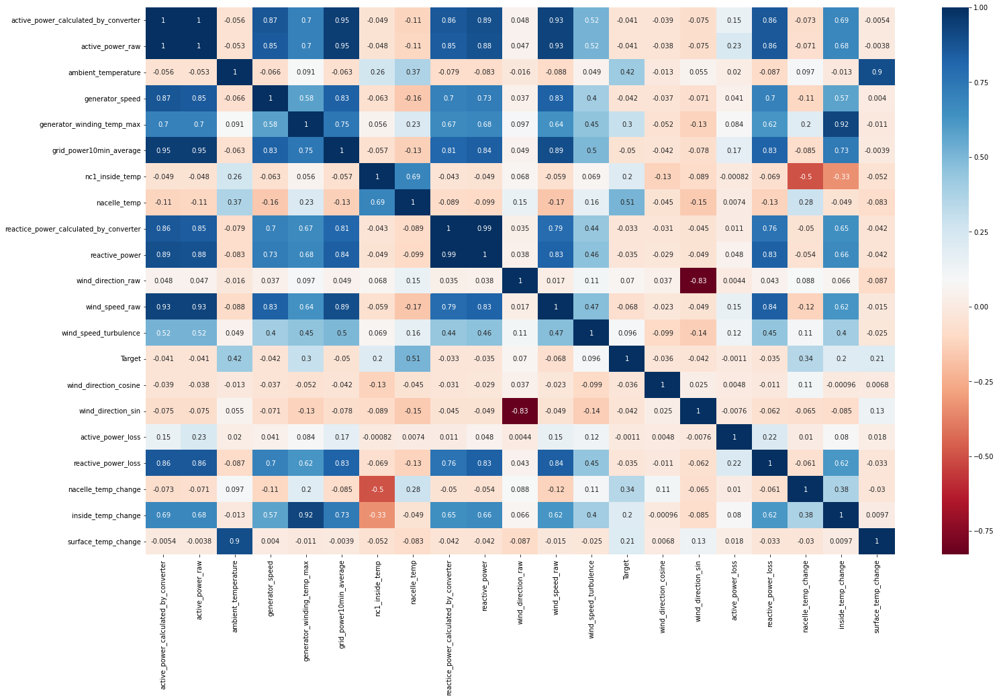

In [ ]:
### Pearson Correlation
plt.figure(figsize=(25, 15))
sns.heatmap(train_data.corr(), annot=True,cmap='RdBu')
plt.show()

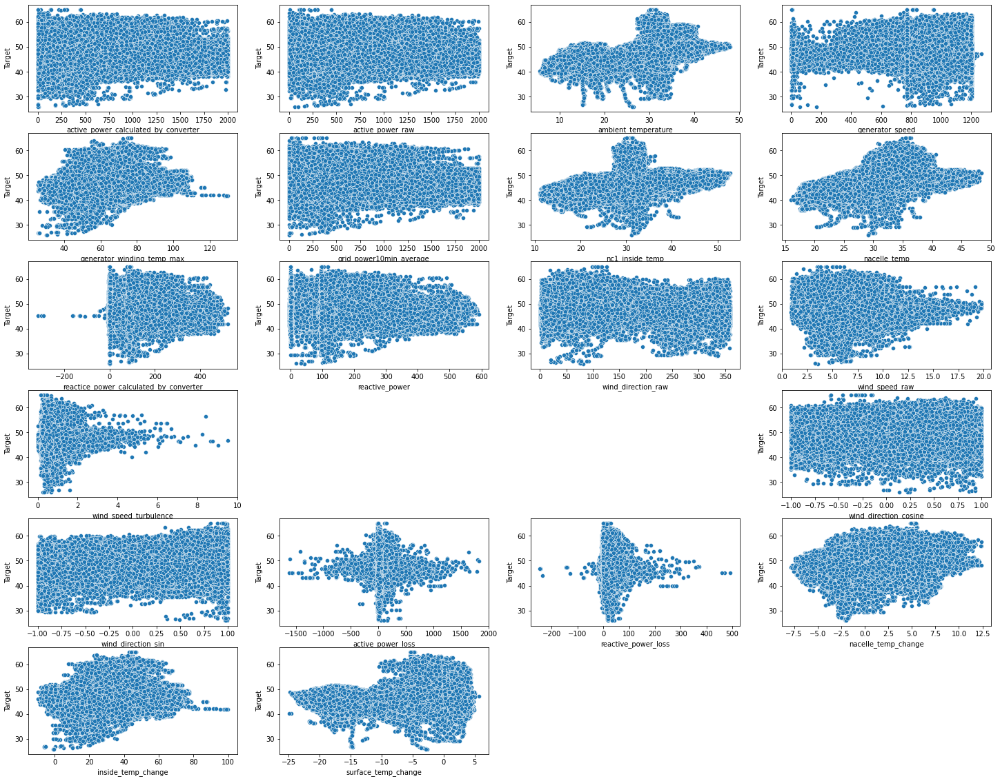

In [ ]:
# Scatter plots btw independent variables and Target
### Checking Outliers
plt.figure(figsize=(25, 20))
for num, i in enumerate(train_data.columns):
  if i not in ["turbine_id", "Target"]:
    plt.subplot(6, 4, num+1)
    #px.histogram(train_data[i])
    sns.scatterplot(train_data[i], train_data['Target'])
    # plt.title(f"{i} vs Target")
plt.show()

### Feature Engineering - `wind_direction_raw`
- Creating wind direction bins using `wind_direction_raw` feature
- Transforming wind_direction_raw feature degrees to **sin & cosine values** of wind_direction.

In [ ]:
# wind direction Classification
wind_classification = [["N", 348.75, 360.0],
                       ["N", 0, 11.25],
                       ["NNE", 11.25, 33.75], 
                       ["NE", 33.75, 56.25], 
                       ["ENE", 56.25, 78.75], 
                       ["E", 78.75, 101.25], 
                       ["ESE", 101.25, 123.75], 
                       ["SE", 123.75, 146.25], 
                       ["SSE", 146.25, 168.75], 
                       ["S", 168.75, 191.25], 
                       ["SSW", 191.25, 213.75], 
                       ["SW", 213.75, 236.25], 
                       ["WSW", 236.25, 258.75], 
                       ["W", 258.75, 281.25], 
                       ["WNW", 281.25, 303.75], 
                       ["NW", 303.75, 326.25], 
                       ["NNW", 326.25, 348.75]]

In [ ]:
wind_classification = pd.DataFrame(wind_classification, columns=["direction", "lower_limit", "upper_limit"])

In [ ]:
print(wind_classification.shape)
wind_classification.head()

(17, 3)


,direction,lower_limit,upper_limit
0,N,348.75,360.00
1,N,0.00,11.25
2,NNE,11.25,33.75
3,NE,33.75,56.25
4,ENE,56.25,78.75


In [ ]:
def get_wind_classes(value):
    for label, l_limit, u_limit in wind_classification.to_numpy():
        if  l_limit <= value <= u_limit:
            return label

In [ ]:
get_wind_classes(2)

'N'

In [ ]:
train_data['wind_direction_classes'] = train_data['wind_direction_raw'].apply(lambda x: get_wind_classes(x))
test_data['wind_direction_classes'] = test_data['wind_direction_raw'].apply(lambda x: get_wind_classes(x))

In [ ]:
train_data['wind_direction_classes'].isnull().sum()

0

In [ ]:
train_data['wind_direction_cosine'] = train_data['wind_direction_raw'].apply(lambda x: np.cos(x*((22/7)/180)))
train_data['wind_direction_sin'] = train_data['wind_direction_raw'].apply(lambda x: np.sin(x*((22/7)/180)))
test_data['wind_direction_cosine'] = test_data['wind_direction_raw'].apply(lambda x: np.cos(x*((22/7)/180)))
test_data['wind_direction_sin'] = test_data['wind_direction_raw'].apply(lambda x: np.sin(x*((22/7)/180)))

In [ ]:
train_data.head()

,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,wind_direction_raw,wind_speed_raw,wind_speed_turbulence,turbine_id,Target,wind_direction_classes,wind_direction_cosine,wind_direction_sin
0,816.636759,834.917206,31.694380,1159.616602,65.954214,917.897085,31.881972,31.504713,141.457644,165.501518,280.864782,7.057000,0.544082,Turbine_108,47.582787,W,0.190429,-0.981701
1,419.107829,421.050873,12.894948,928.747996,59.571319,445.554250,32.423705,32.755770,89.186457,113.835236,299.552460,5.474937,0.469031,Turbine_18,46.070328,WNW,0.495050,-0.868865
2,1303.530558,1337.566142,16.648388,1201.219775,61.270498,1364.716003,11.446849,18.332985,230.622309,281.452253,84.960106,8.092457,0.622318,Turbine_105,39.989236,E,0.087255,0.996186
3,61.494872,53.481008,28.388141,769.806122,40.674348,14.324897,34.253204,32.662889,66.211015,75.017531,87.261119,4.071032,0.760719,Turbine_15,46.056587,E,0.047172,0.998887
4,593.514364,611.659108,31.519527,1046.916768,64.341763,599.020172,32.405586,31.466387,137.163938,160.202421,313.724818,6.357943,0.346068,Turbine_01,54.346095,NW,0.692787,-0.721143


In [ ]:
test_data.head(2)

,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,wind_direction_raw,wind_speed_raw,wind_speed_turbulence,turbine_id,wind_direction_classes,wind_direction_cosine,wind_direction_sin
0,15.507537,19.956882,40.233264,410.538834,57.357366,84.008399,48.826597,45.363477,2.419202,1.468876,156.399396,2.438629,0.790435,Turbine_14,SSE,-0.916798,0.399352
1,472.577255,478.373881,12.306687,965.077563,51.796728,492.531362,27.457511,24.045565,96.152070,119.378235,56.443802,5.900371,0.544198,Turbine_19,ENE,0.552424,0.833563


### Feature Engineering - Calculating power losses

In [ ]:
train_data.head()

,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,wind_direction_raw,wind_speed_raw,wind_speed_turbulence,turbine_id,Target,wind_direction_classes,wind_direction_cosine,wind_direction_sin
0,816.636759,834.917206,31.694380,1159.616602,65.954214,917.897085,31.881972,31.504713,141.457644,165.501518,280.864782,7.057000,0.544082,Turbine_108,47.582787,W,0.190429,-0.981701
1,419.107829,421.050873,12.894948,928.747996,59.571319,445.554250,32.423705,32.755770,89.186457,113.835236,299.552460,5.474937,0.469031,Turbine_18,46.070328,WNW,0.495050,-0.868865
2,1303.530558,1337.566142,16.648388,1201.219775,61.270498,1364.716003,11.446849,18.332985,230.622309,281.452253,84.960106,8.092457,0.622318,Turbine_105,39.989236,E,0.087255,0.996186
3,61.494872,53.481008,28.388141,769.806122,40.674348,14.324897,34.253204,32.662889,66.211015,75.017531,87.261119,4.071032,0.760719,Turbine_15,46.056587,E,0.047172,0.998887
4,593.514364,611.659108,31.519527,1046.916768,64.341763,599.020172,32.405586,31.466387,137.163938,160.202421,313.724818,6.357943,0.346068,Turbine_01,54.346095,NW,0.692787,-0.721143


In [ ]:
train_data['active_power_loss'] = train_data['active_power_raw'] - train_data['active_power_calculated_by_converter']
test_data['active_power_loss'] = test_data['active_power_raw'] - test_data['active_power_calculated_by_converter']

In [ ]:
train_data['reactive_power_loss'] = train_data['reactive_power'] - train_data['reactice_power_calculated_by_converter']
test_data['reactive_power_loss'] = test_data['reactive_power'] - test_data['reactice_power_calculated_by_converter']

In [ ]:
train_data['grid_power_loss'] = train_data['grid_power10min_average'] - train_data['active_power_calculated_by_converter']
test_data['grid_power_loss'] = test_data['grid_power10min_average'] - test_data['active_power_calculated_by_converter']

In [ ]:
train_data.head(2)

,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,...,wind_speed_raw,wind_speed_turbulence,turbine_id,Target,wind_direction_classes,wind_direction_cosine,wind_direction_sin,active_power_loss,reactive_power_loss,grid_power_loss
0,816.636759,834.917206,31.694380,1159.616602,65.954214,917.897085,31.881972,31.504713,141.457644,165.501518,...,7.057000,0.544082,Turbine_108,47.582787,W,0.190429,-0.981701,18.280446,24.043874,101.260325
1,419.107829,421.050873,12.894948,928.747996,59.571319,445.554250,32.423705,32.755770,89.186457,113.835236,...,5.474937,0.469031,Turbine_18,46.070328,WNW,0.495050,-0.868865,1.943044,24.648778,26.446421


In [ ]:
test_data.head()

,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,wind_direction_raw,wind_speed_raw,wind_speed_turbulence,turbine_id,wind_direction_classes,wind_direction_cosine,wind_direction_sin,active_power_loss,reactive_power_loss,grid_power_loss
0,15.507537,19.956882,40.233264,410.538834,57.357366,84.008399,48.826597,45.363477,2.419202,1.468876,156.399396,2.438629,0.790435,Turbine_14,SSE,-0.916798,0.399352,4.449345,-0.950326,68.500862
1,472.577255,478.373881,12.306687,965.077563,51.796728,492.531362,27.457511,24.045565,96.152070,119.378235,56.443802,5.900371,0.544198,Turbine_19,ENE,0.552424,0.833563,5.796626,23.226165,19.954107
2,447.829615,451.158264,29.106771,948.035899,60.493098,393.151576,39.410553,35.715697,90.251529,117.192635,224.540263,5.924923,0.513481,Turbine_14,SW,-0.711650,-0.702534,3.328649,26.941106,-54.678040
3,254.014336,249.438965,27.074900,804.963776,55.741899,178.715101,29.476841,31.151895,89.273838,105.086257,182.151426,4.409707,0.448881,Turbine_120,S,-0.999246,-0.038819,-4.575371,15.812419,-75.299235
4,1174.930566,1202.654077,32.148434,1199.754858,67.272313,1115.850317,31.920549,30.864276,189.731988,236.053320,261.672180,7.822326,0.561465,Turbine_158,W,-0.143018,-0.989720,27.723511,46.321332,-59.080249


In [ ]:
train_data['reactive_power'] = train_data['reactive_power'].apply(lambda x: np.abs(x))
train_data['active_power_loss'] = train_data['active_power_loss'].apply(lambda x: np.abs(x))
train_data['reactive_power_loss'] = train_data['reactive_power_loss'].apply(lambda x: np.abs(x))
train_data['grid_power_loss'] = train_data['grid_power_loss'].apply(lambda x: np.abs(x))

In [ ]:
test_data['reactive_power'] = test_data['reactive_power'].apply(lambda x: np.abs(x))
test_data['active_power_loss'] = test_data['active_power_loss'].apply(lambda x: np.abs(x))
test_data['reactive_power_loss'] = test_data['reactive_power_loss'].apply(lambda x: np.abs(x))
test_data['grid_power_loss'] = test_data['grid_power_loss'].apply(lambda x: np.abs(x))

### Feature Engineering - Calculating Temperature Changes

In [ ]:
train_data['nacelle_temp_change'] = train_data['nacelle_temp'] - train_data['nc1_inside_temp']
test_data['nacelle_temp_change'] = test_data['nacelle_temp'] - test_data['nc1_inside_temp']

In [ ]:
train_data['surface_temp_change'] = train_data['ambient_temperature'] - train_data['nacelle_temp']
test_data['surface_temp_change'] = test_data['ambient_temperature'] - test_data['nacelle_temp']

In [ ]:
train_data['inside_temp_change'] = train_data['generator_winding_temp_max'] - train_data['nc1_inside_temp']
test_data['inside_temp_change'] = test_data['generator_winding_temp_max'] - test_data['nc1_inside_temp']

In [ ]:
train_data[['nacelle_temp_change', 'surface_temp_change', 'inside_temp_change']].describe()

,nacelle_temp_change,surface_temp_change,inside_temp_change
count,909604.000000,909604.000000,909604.000000
mean,-0.069410,-6.112492,28.974289
std,2.958234,7.495892,10.279144
min,-7.805130,-24.943896,-9.701803
25%,-2.681466,-13.494597,22.502224
50%,-0.434664,-4.142037,28.109945
75%,2.080702,0.206667,34.849787
max,12.387167,5.710177,99.845596


In [ ]:
train_data.head()

,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,...,Target,wind_direction_classes,wind_direction_cosine,wind_direction_sin,active_power_loss,reactive_power_loss,grid_power_loss,nacelle_temp_change,surface_temp_change,inside_temp_change
0,816.636759,834.917206,31.694380,1159.616602,65.954214,917.897085,31.881972,31.504713,141.457644,165.501518,...,47.582787,W,0.190429,-0.981701,18.280446,24.043874,101.260325,-0.377259,0.189667,34.072243
1,419.107829,421.050873,12.894948,928.747996,59.571319,445.554250,32.423705,32.755770,89.186457,113.835236,...,46.070328,WNW,0.495050,-0.868865,1.943044,24.648778,26.446421,0.332065,-19.860822,27.147614
2,1303.530558,1337.566142,16.648388,1201.219775,61.270498,1364.716003,11.446849,18.332985,230.622309,281.452253,...,39.989236,E,0.087255,0.996186,34.035583,50.829943,61.185445,6.886136,-1.684597,49.823649
3,61.494872,53.481008,28.388141,769.806122,40.674348,14.324897,34.253204,32.662889,66.211015,75.017531,...,46.056587,E,0.047172,0.998887,-8.013865,8.806516,-47.169976,-1.590315,-4.274748,6.421143
4,593.514364,611.659108,31.519527,1046.916768,64.341763,599.020172,32.405586,31.466387,137.163938,160.202421,...,54.346095,NW,0.692787,-0.721143,18.144745,23.038483,5.505809,-0.939198,0.053140,31.936177


In [ ]:
train_data.columns

Index(['active_power_calculated_by_converter', 'active_power_raw',
       'ambient_temperature', 'generator_speed', 'generator_winding_temp_max',
       'grid_power10min_average', 'nc1_inside_temp', 'nacelle_temp',
       'reactice_power_calculated_by_converter', 'reactive_power',
       'wind_direction_raw', 'wind_speed_raw', 'wind_speed_turbulence',
       'turbine_id', 'Target', 'wind_direction_classes',
       'wind_direction_cosine', 'wind_direction_sin', 'active_power_loss',
       'reactive_power_loss', 'grid_power_loss', 'nacelle_temp_change',
       'surface_temp_change', 'inside_temp_change'],
      dtype='object')

In [ ]:
train_data['nacelle_temp_change'] = train_data['nacelle_temp_change'].apply(lambda x: np.abs(x))
train_data['surface_temp_change'] = train_data['surface_temp_change'].apply(lambda x: np.abs(x))
train_data['inside_temp_change'] = train_data['inside_temp_change'].apply(lambda x: np.abs(x))

In [ ]:
test_data['nacelle_temp_change'] = test_data['nacelle_temp_change'].apply(lambda x: np.abs(x))
test_data['surface_temp_change'] = test_data['surface_temp_change'].apply(lambda x: np.abs(x))
test_data['inside_temp_change'] = test_data['inside_temp_change'].apply(lambda x: np.abs(x))

In [ ]:
train_data.describe()

,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,...,wind_speed_turbulence,Target,wind_direction_cosine,wind_direction_sin,active_power_loss,reactive_power_loss,grid_power_loss,nacelle_temp_change,surface_temp_change,inside_temp_change
count,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,...,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,909604.000000,9.096040e+05,909604.000000
mean,525.886061,537.639468,25.573921,931.130882,60.730112,527.579537,31.755823,31.686413,111.080610,133.715378,...,0.651916,46.328595,0.098014,-0.177521,19.188624,22.803105,93.932557,2.477730,6.907713e+00,28.988134
std,474.619576,482.394907,8.025649,193.674384,9.721582,472.656976,3.929794,3.554426,78.219944,91.198372,...,0.317513,2.617691,0.629508,0.750067,38.247882,16.000324,114.499995,1.617658,6.770114e+00,10.240034
min,0.000000,0.000008,5.616541,0.000000,25.636366,0.000000,11.141922,16.010218,-318.393721,0.000000,...,0.000000,25.865320,-1.000000,-1.000000,0.000005,0.000040,0.000000,0.000024,6.357829e-07,0.000128
25%,149.620898,155.813244,17.093680,770.538574,54.916767,147.181552,29.913803,30.267423,81.540850,96.045765,...,0.432129,44.816740,-0.442848,-0.897140,4.957190,11.755214,23.537971,1.190955,1.308936e+00,22.502224
50%,379.989929,383.985926,27.919035,884.068502,60.034490,391.303187,31.762946,31.961610,92.005826,107.633378,...,0.583863,46.302899,0.149977,-0.449464,10.787267,19.980251,55.974125,2.381740,4.176085e+00,28.109945
75%,781.357475,800.261108,32.171696,1123.335856,65.737187,794.875710,33.469745,33.546260,124.879153,154.153730,...,0.798240,47.733105,0.679648,0.630788,21.859561,31.367454,120.155204,3.425248,1.349460e+01,34.849787
max,1999.999858,1999.984456,48.089017,1267.140625,129.846405,1999.991455,52.790030,48.406106,523.892695,592.815938,...,9.534769,65.037689,0.999985,1.000000,1829.804627,492.170963,1888.417704,12.387167,2.494390e+01,99.845596


In [ ]:
test_data.describe()

,active_power_calculated_by_converter,active_power_raw,ambient_temperature,generator_speed,generator_winding_temp_max,grid_power10min_average,nc1_inside_temp,nacelle_temp,reactice_power_calculated_by_converter,reactive_power,...,wind_speed_raw,wind_speed_turbulence,wind_direction_cosine,wind_direction_sin,active_power_loss,reactive_power_loss,grid_power_loss,nacelle_temp_change,surface_temp_change,inside_temp_change
count,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,...,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000,303202.000000
mean,525.681746,537.293596,25.591148,931.053027,60.749563,527.773128,31.762555,31.699346,111.004157,133.635260,...,5.892971,0.651781,0.095271,-0.178851,19.194062,22.799429,94.022454,2.473242,6.906030,29.000286
std,474.203174,481.896219,8.018596,193.601381,9.701372,472.053401,3.932439,3.545439,78.090995,91.073022,...,1.974445,0.316810,0.629101,0.750447,38.529226,15.963479,113.903178,1.618361,6.778062,10.217709
min,0.000000,0.000146,5.591293,0.000000,25.522359,0.000000,11.114894,16.558018,-269.505872,0.000000,...,0.910083,0.000000,-1.000000,-1.000000,0.000061,0.000138,0.000000,0.000009,0.000006,0.001689
25%,149.410290,155.873531,17.107900,770.538574,54.956130,147.451206,29.923965,30.288546,81.514672,96.032887,...,4.398779,0.431627,-0.444984,-0.898355,4.985016,11.761105,23.578254,1.185837,1.304207,22.506177
50%,379.413684,383.434929,27.946935,883.336072,60.050446,392.406166,31.773077,31.970005,91.934136,107.528205,...,5.633314,0.583164,0.145093,-0.452658,10.797070,19.955171,56.119901,2.375368,4.152809,28.131174
75%,783.186417,802.224597,32.173036,1123.579971,65.753130,796.195534,33.480130,33.550202,124.955650,154.144882,...,7.090882,0.798584,0.676065,0.629255,21.856501,31.378318,120.715661,3.423185,13.525591,34.866078
max,1999.976318,1999.970825,47.886087,1249.782534,129.628894,1999.981852,52.739494,48.395732,505.596202,591.706401,...,19.607500,8.593856,0.999940,1.000000,1670.046900,424.748684,1852.234263,12.057171,25.062200,99.597485


### Turbine ID wise `Catboost Model` Development

In [ ]:
def get_id_wise_models(turbine_id, outputs, ignore_names=[], iterations=100):
    print(turbine_id)
    print()
    data = train_data[train_data['turbine_id'] == turbine_id]
    t_data = test_data[test_data['turbine_id'] == turbine_id]
    data = data.drop('turbine_id', axis=1)
    t_data = t_data.drop('turbine_id', axis=1)
    print(data.shape)
    print(t_data.shape)
    X = data.drop(['Target'], axis=1)
    y = data['Target']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
    cat = CatBoostRegressor(iterations=iterations, #22000 should be kept
                        learning_rate=1,
                        random_seed=42,
                       loss_function="MAPE",
                       task_type='GPU',
                       depth=13,
                       gpu_ram_part=1,
                       l2_leaf_reg=2,
                       bagging_temperature=1,
                       ignored_features=ignore_names) # ignored_features=ignore_names
    
    train_pool = Pool(data=X_train, 
                      label=y_train,
                      cat_features=['wind_direction_classes'])

    val_pool = Pool(data=X_test, 
                    label=y_test, 
                    cat_features=['wind_direction_classes'])
    
    test_pool = Pool(t_data, 
                     cat_features=['wind_direction_classes'])
    
    cat.fit(train_pool, 
            eval_set=val_pool, 
            verbose=False,
            plot=True,
            save_snapshot=True,
            snapshot_file='snapshot_t_108.bkp', 
            snapshot_interval=1)
    # os.remove('catboost_info/snapshot_1.bkp')
    ignore_names = []
    for num, i in enumerate(cat.feature_importances_):
        if i < 4:
            ignore_names.append(cat.feature_names_[num])
    print()
    print(f"ignored_features: {ignore_names}")
        

    y_val_predict = cat.predict(val_pool)
    mape = mean_absolute_percentage_error(y_test, y_val_predict)
    
    print(f"MAPE Achieved: {mape}")
    plt.figure(figsize=(15, 10))
    sns.barplot(cat.feature_importances_, cat.feature_names_, orient="h")
    plt.show()
    print()
    print("----------------")
    
    y_test_predict = cat.predict(test_pool)
    best_mape = mape
    
    return t_data.index, y_test_predict, best_mape, cat.feature_importances_

In [ ]:
feature_names = ['active_power_calculated_by_converter', 'active_power_raw',
                'ambient_temperature', 'generator_speed', 'generator_winding_temp_max',
                'grid_power10min_average', 'nc1_inside_temp', 'nacelle_temp',
                'reactice_power_calculated_by_converter', 'reactive_power',
                'wind_direction_raw', 'wind_speed_raw', 'wind_speed_turbulence',
                'wind_direction_classes',
                'wind_direction_cosine', 'wind_direction_sin', 'active_power_loss',
                'reactive_power_loss', 'grid_power_loss', 'nacelle_temp_change',
                'surface_temp_change', 'inside_temp_change']

In [ ]:
ignore_features = {}
for turbine_id in feature_imps:
    i_features = []
    for num, i in enumerate(feature_imps[turbine_id]):
        if i < 4:
            i_features.append(feature_names[num])
    ignore_features[turbine_id] = i_features

In [ ]:
ignore_features

{'Turbine_108': ['active_power_calculated_by_converter',
  'active_power_raw',
  'generator_speed',
  'reactice_power_calculated_by_converter',
  'reactive_power',
  'wind_speed_raw',
  'wind_direction_classes',
  'active_power_loss',
  'reactive_power_loss',
  'grid_power_loss'],
 'Turbine_18': ['active_power_calculated_by_converter',
  'active_power_raw',
  'generator_speed',
  'reactice_power_calculated_by_converter',
  'reactive_power',
  'wind_speed_raw',
  'wind_speed_turbulence',
  'wind_direction_classes',
  'wind_direction_cosine',
  'active_power_loss',
  'reactive_power_loss',
  'grid_power_loss'],
 'Turbine_105': ['active_power_calculated_by_converter',
  'active_power_raw',
  'generator_speed',
  'reactice_power_calculated_by_converter',
  'reactive_power',
  'wind_speed_raw',
  'wind_speed_turbulence',
  'wind_direction_classes',
  'wind_direction_cosine',
  'active_power_loss',
  'reactive_power_loss',
  'grid_power_loss'],
 'Turbine_15': ['active_power_calculated_by_con

**Using the following excel sheet parameters & features to get the Best MAPE without time features**. The parameters which are not present in the sheet are same as the above code.
- Sheet Link:- [link](https://docs.google.com/spreadsheets/d/1HHlDbiaNPW3lsrapQi8m_rdRzymJamdfEkr7oqpOrMI/edit?usp=sharing)

In [ ]:
turbine_wise_iterations = {}
for turbine_id in train_data['turbine_id'].unique():
  if turbine_id in ["Turbine_108", "Turbine_15", "Turbine_120", "Turbine_97", "Turbine_158"]:
    turbine_wise_iterations[turbine_id] = 5000
  elif turbine_id in ["Turbine_20", "Turbine_01"]:
    turbine_wise_iterations[turbine_id] = 10000
  else:
    turbine_wise_iterations[turbine_id] = 2500

Turbine_108

(57401, 23)
(19021, 22)
(40180, 22) (40180,) (17221, 22) (17221,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_speed_raw', 'wind_direction_classes', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.012500200900730538


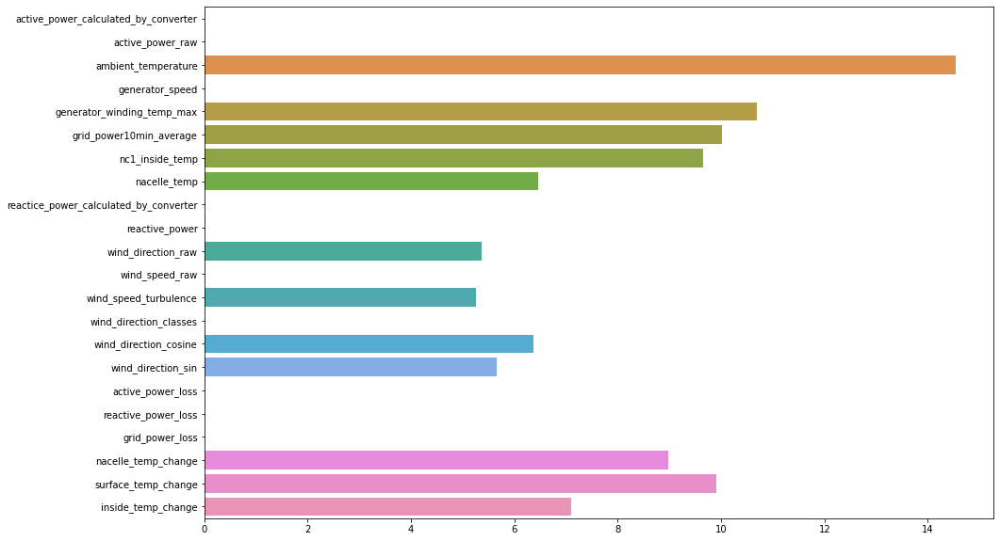


----------------
Turbine_18

(57892, 23)
(19310, 22)
(40524, 22) (40524,) (17368, 22) (17368,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_speed_raw', 'wind_speed_turbulence', 'wind_direction_classes', 'wind_direction_cosine', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.01210056361004843


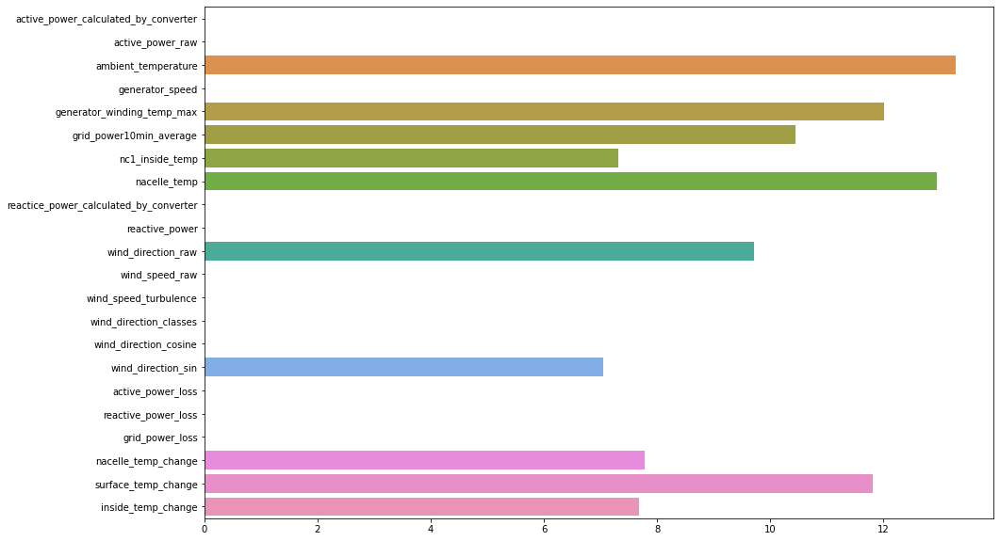


----------------
Turbine_105

(57341, 23)
(19308, 22)
(40138, 22) (40138,) (17203, 22) (17203,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_speed_raw', 'wind_speed_turbulence', 'wind_direction_classes', 'wind_direction_cosine', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.01091853319292473


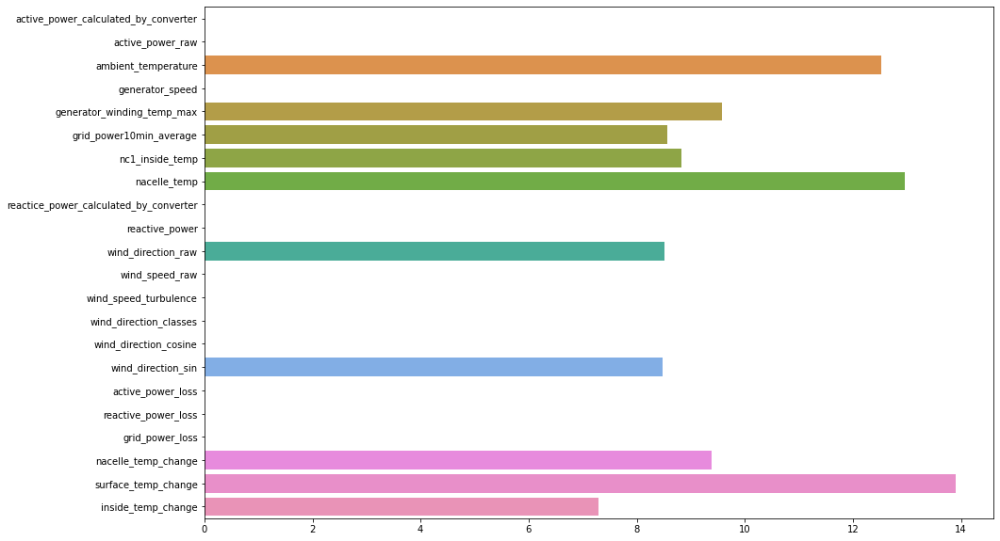


----------------
Turbine_15

(58048, 23)
(19533, 22)
(40633, 22) (40633,) (17415, 22) (17415,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_speed_raw', 'wind_direction_classes', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.01292095317654191


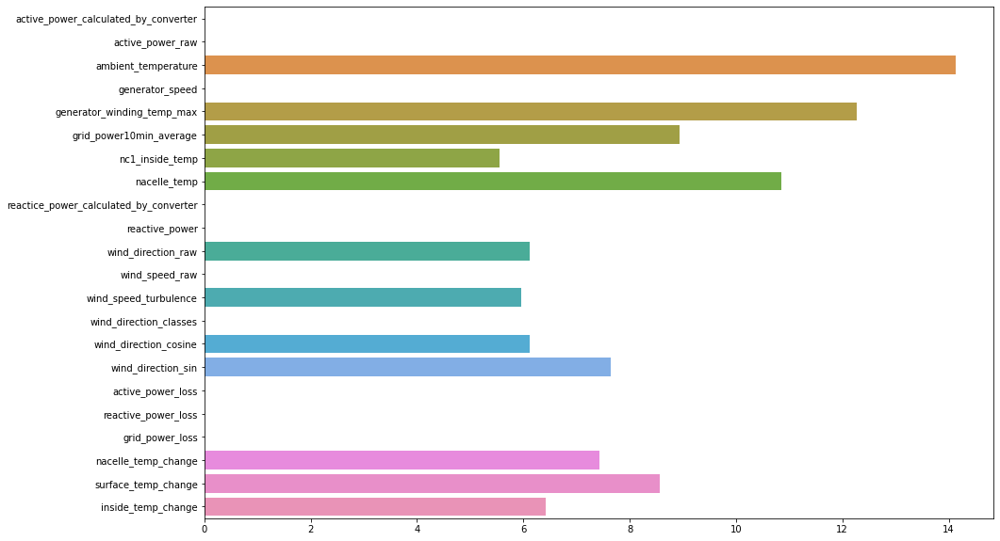


----------------
Turbine_01

(54171, 23)
(18039, 22)
(37919, 22) (37919,) (16252, 22) (16252,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'nc1_inside_temp', 'reactive_power', 'wind_speed_raw', 'wind_direction_classes', 'wind_direction_cosine', 'wind_direction_sin', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss', 'inside_temp_change']
MAPE Achieved: 0.01683064298520347


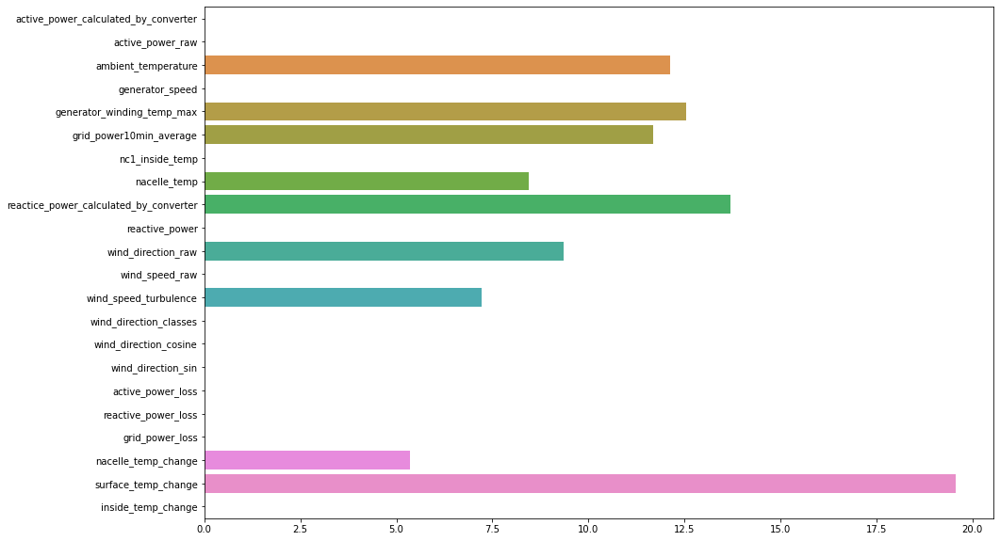


----------------
Turbine_14

(56934, 23)
(18960, 22)
(39853, 22) (39853,) (17081, 22) (17081,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_speed_raw', 'wind_speed_turbulence', 'wind_direction_classes', 'wind_direction_sin', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.01045633247104933


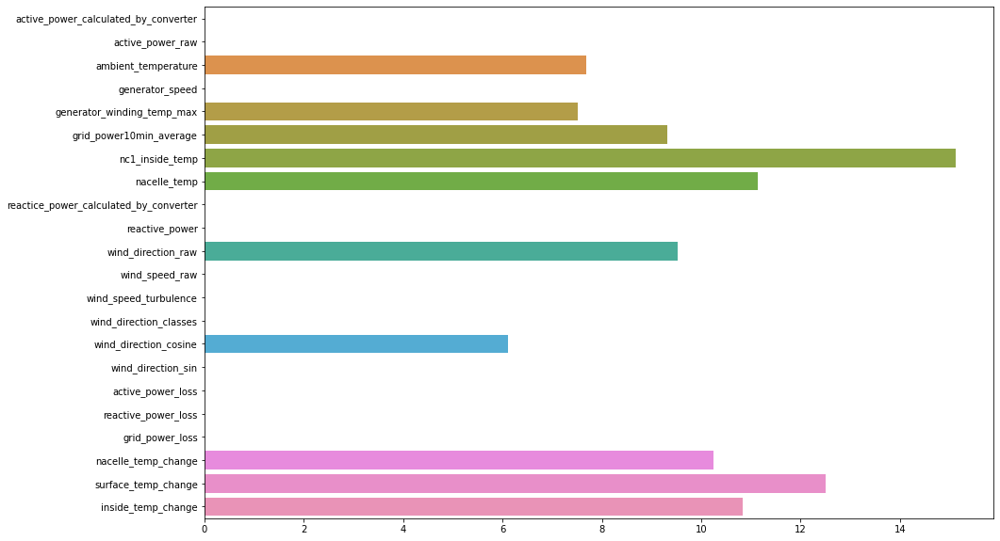


----------------
Turbine_10

(55089, 23)
(18333, 22)
(38562, 22) (38562,) (16527, 22) (16527,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'ambient_temperature', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_direction_raw', 'wind_speed_raw', 'wind_direction_classes', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.013501288515761703


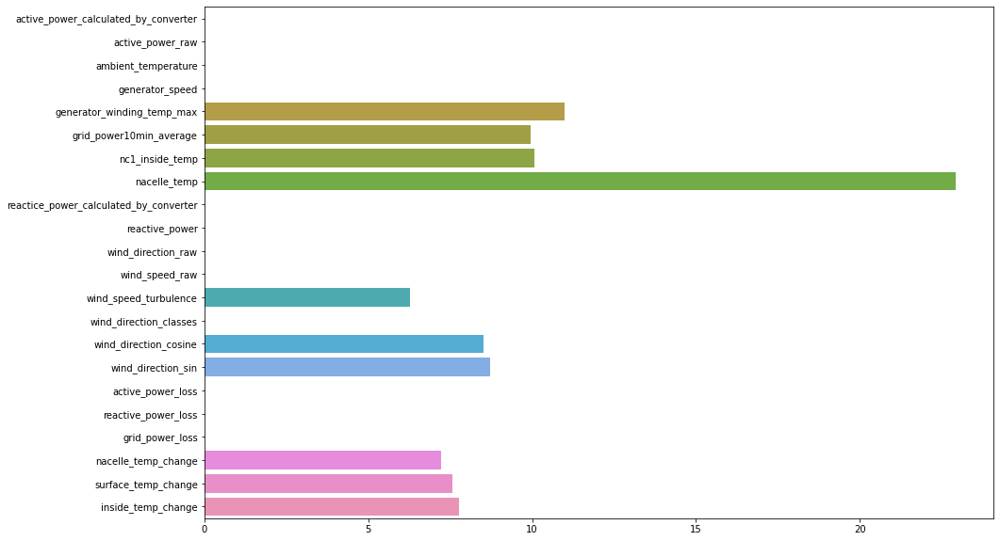


----------------
Turbine_103

(56944, 23)
(18982, 22)
(39860, 22) (39860,) (17084, 22) (17084,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_direction_raw', 'wind_speed_raw', 'wind_direction_classes', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.010476884816403437


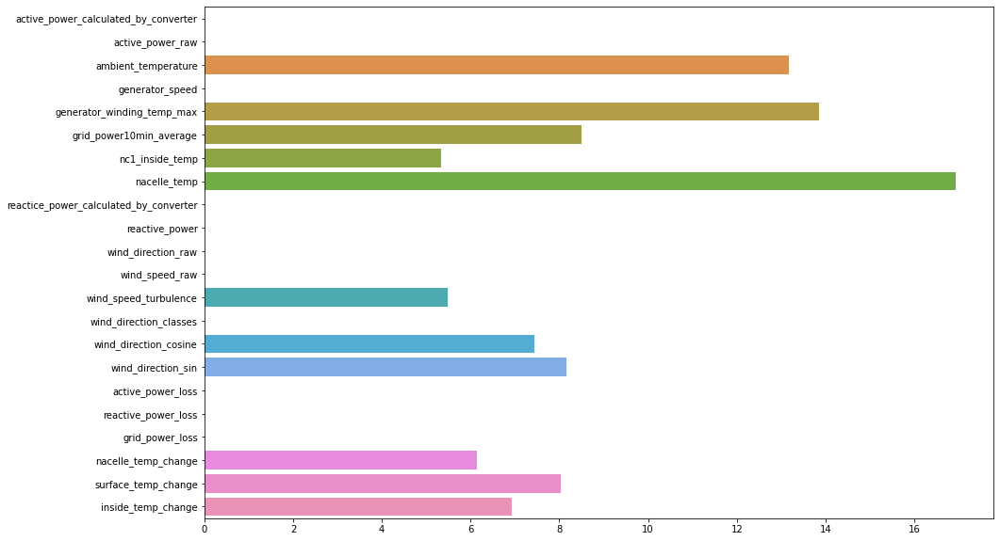


----------------
Turbine_123

(56225, 23)
(18683, 22)
(39357, 22) (39357,) (16868, 22) (16868,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_speed_raw', 'wind_direction_classes', 'wind_direction_sin', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.011590895984644634


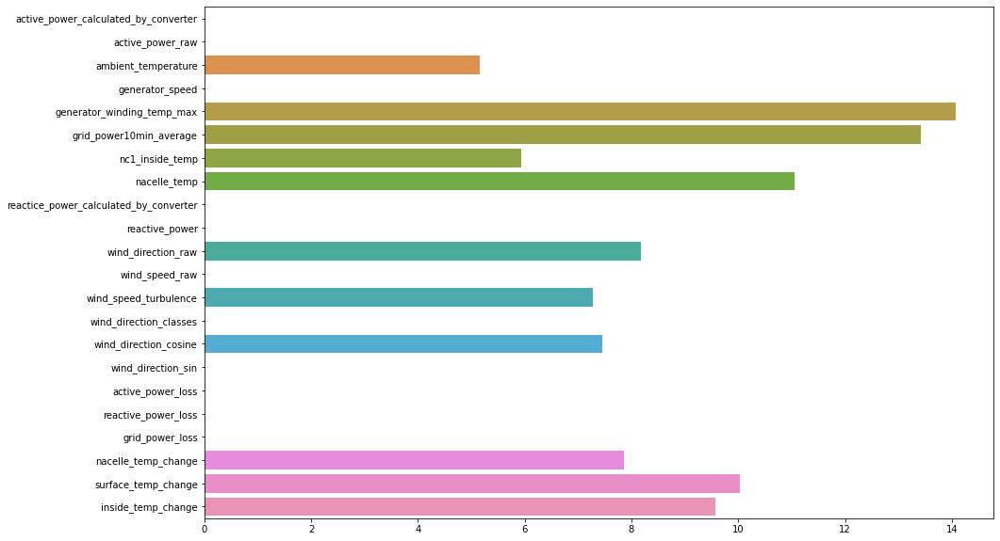


----------------
Turbine_120

(57754, 23)
(19116, 22)
(40427, 22) (40427,) (17327, 22) (17327,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_direction_raw', 'wind_speed_raw', 'wind_direction_classes', 'wind_direction_cosine', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.0154271609617379


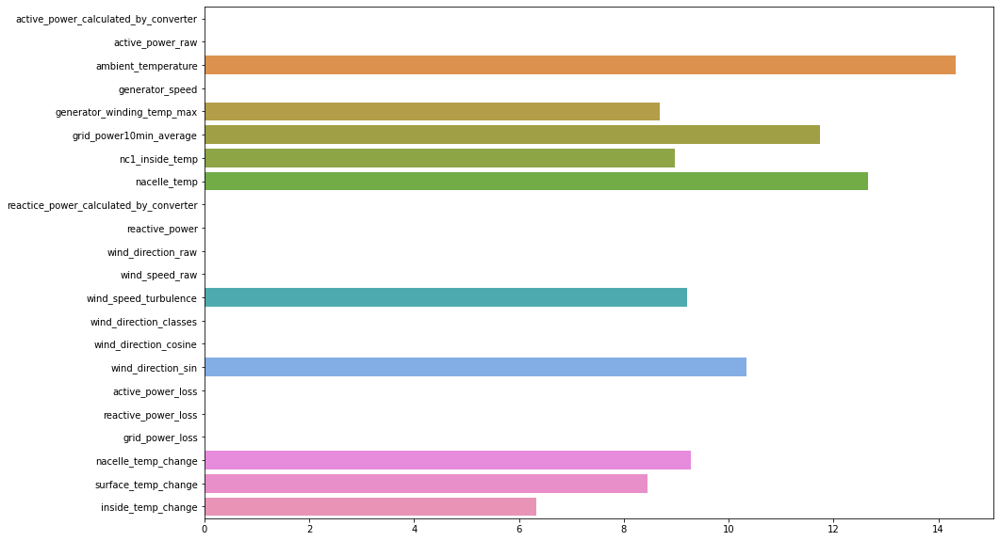


----------------
Turbine_139

(56930, 23)
(18890, 22)
(39851, 22) (39851,) (17079, 22) (17079,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_direction_raw', 'wind_speed_raw', 'wind_direction_classes', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss', 'nacelle_temp_change']
MAPE Achieved: 0.01237547747933631


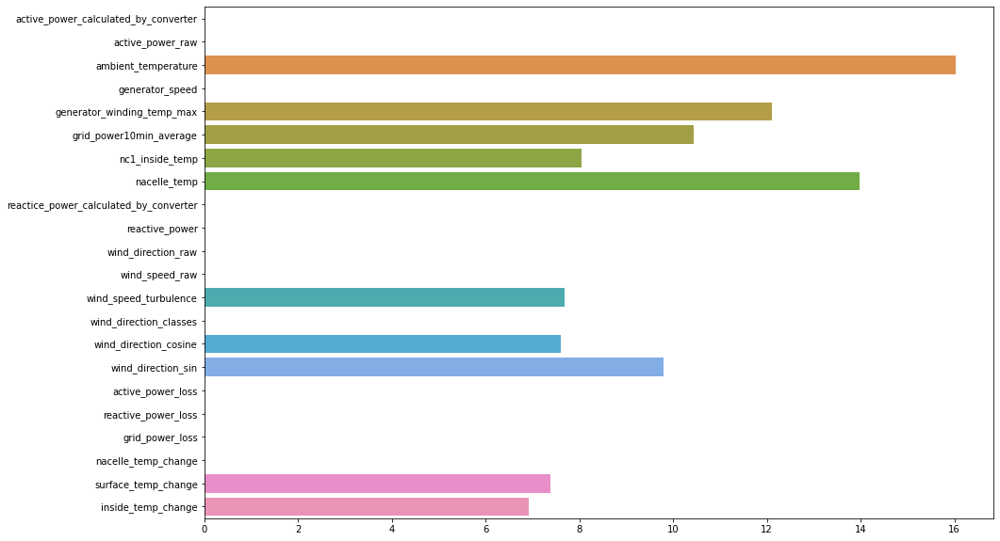


----------------
Turbine_97

(57683, 23)
(19341, 22)
(40378, 22) (40378,) (17305, 22) (17305,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'nc1_inside_temp', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_speed_raw', 'wind_speed_turbulence', 'wind_direction_classes', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.013693810546200315


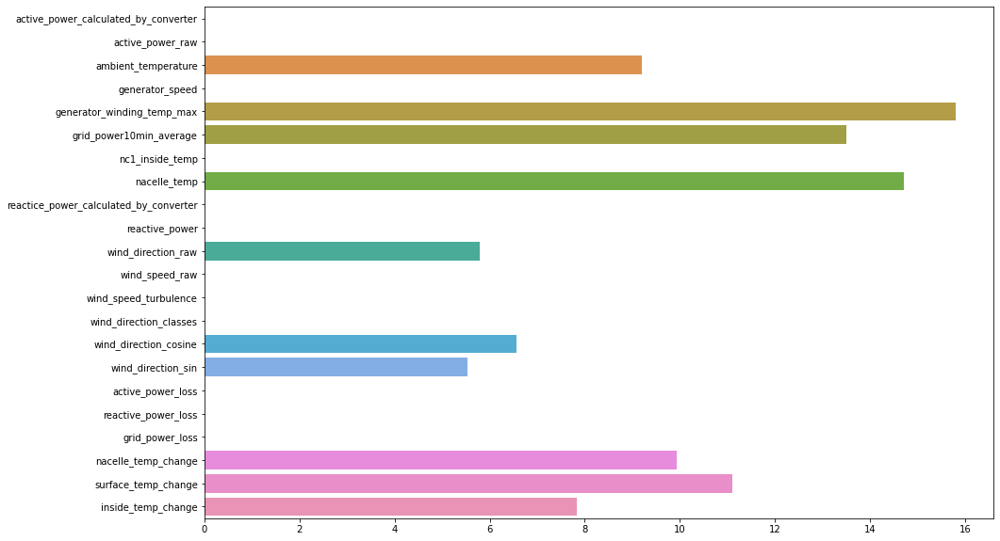


----------------
Turbine_19

(56346, 23)
(18708, 22)
(39442, 22) (39442,) (16904, 22) (16904,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_speed_raw', 'wind_direction_classes', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.00883293667986982


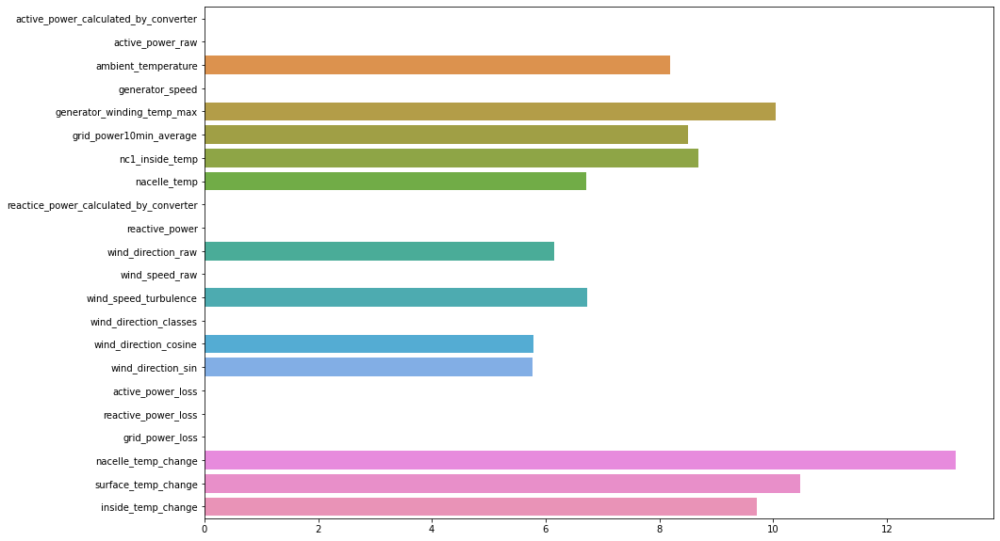


----------------
Turbine_20

(56523, 23)
(18933, 22)
(39566, 22) (39566,) (16957, 22) (16957,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_direction_raw', 'wind_speed_raw', 'wind_direction_classes', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss', 'inside_temp_change']
MAPE Achieved: 0.03430462220686751


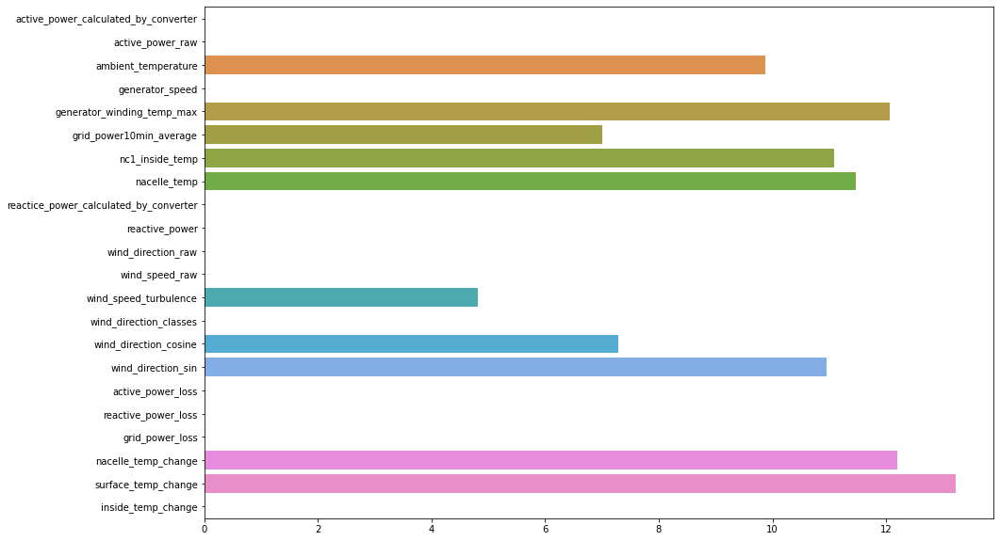


----------------
Turbine_13

(56853, 23)
(18733, 22)
(39797, 22) (39797,) (17056, 22) (17056,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactice_power_calculated_by_converter', 'reactive_power', 'wind_speed_raw', 'wind_speed_turbulence', 'wind_direction_classes', 'wind_direction_cosine', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.011816355250510556


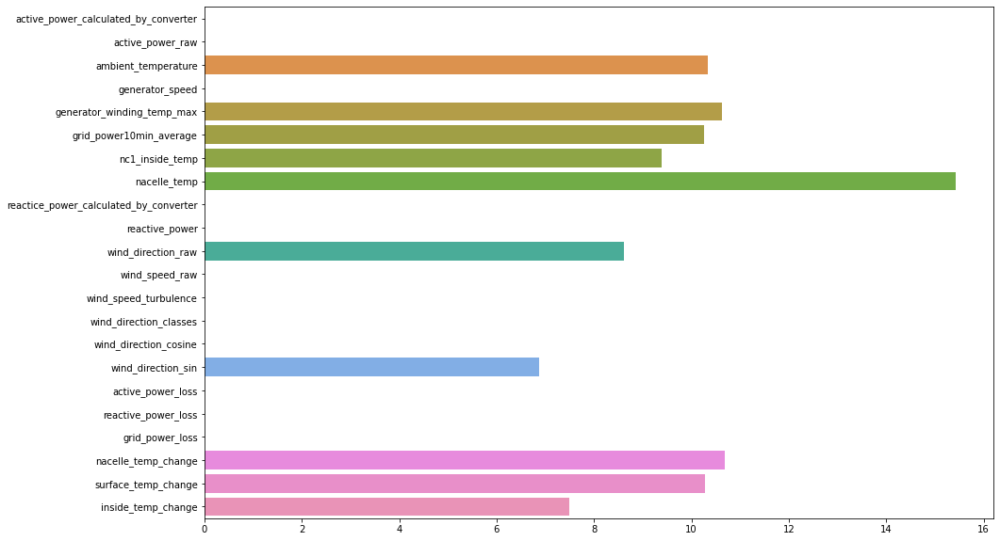


----------------
Turbine_158

(57470, 23)
(19312, 22)
(40229, 22) (40229,) (17241, 22) (17241,)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


ignored_features: ['active_power_calculated_by_converter', 'active_power_raw', 'generator_speed', 'reactive_power', 'wind_speed_raw', 'wind_speed_turbulence', 'wind_direction_classes', 'wind_direction_cosine', 'active_power_loss', 'reactive_power_loss', 'grid_power_loss']
MAPE Achieved: 0.014831686220444765


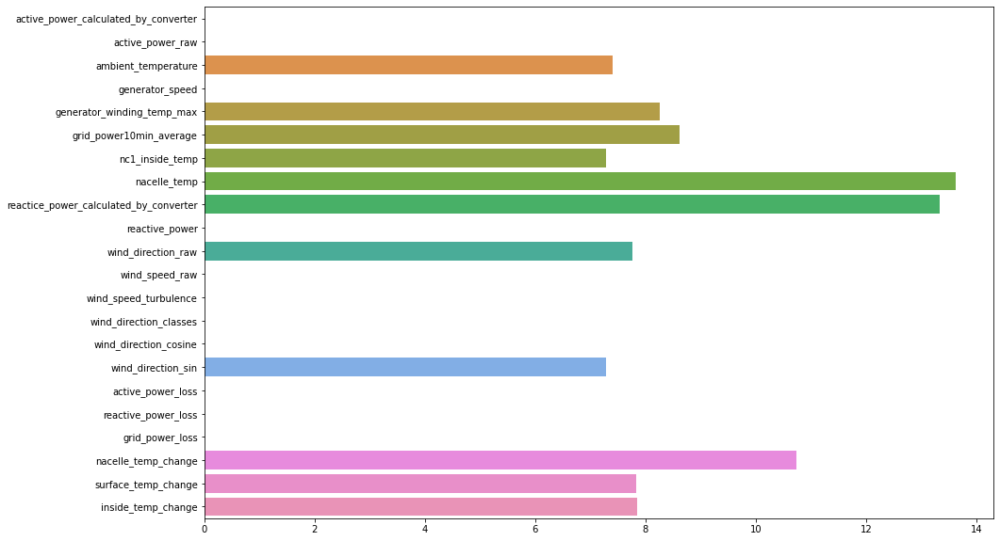


----------------


In [ ]:
outputs = {}
mape_values = []
feature_imps = {}
for turbine_id in train_data['turbine_id'].unique():
    indexs, predicted_values, mape, feature_imp = get_id_wise_models(turbine_id, 
                                                                     outputs, 
                                                                     ignore_names=ignore_features[turbine_id],
                                                                     iterations=turbine_wise_iterations[turbine_id])
    mape_values.append(mape)
    feature_imps[turbine_id] = feature_imp
    
    
    for index, value in zip(indexs, predicted_values):
        outputs[index] = value

In [ ]:
len(outputs)

303202

In [ ]:
test_data.shape

(303202, 23)

In [ ]:
mape_values

[0.012500200900730538,
 0.01210056361004843,
 0.01091853319292473,
 0.01292095317654191,
 0.01683064298520347,
 0.01045633247104933,
 0.013501288515761703,
 0.010476884816403437,
 0.011590895984644634,
 0.0154271609617379,
 0.01237547747933631,
 0.013693810546200315,
 0.00883293667986982,
 0.03430462220686751,
 0.011816355250510556,
 0.014831686220444765]

In [ ]:
np.mean(mape_values)

0.01391114656239221

In [ ]:
from collections import OrderedDict
dict1 = OrderedDict(sorted(outputs.items()))

In [ ]:
pd.DataFrame(dict1.values(), index=dict1.keys(), columns=['Target']).to_csv('submissions/submission.csv', index=False)